# Modelo LightGBM con Embeddings

**Autor:** Mariluz Daniela Sánchez Morales 

**Descripción:** Este notebook realiza el desarrollo, entrenamiento y evaluación del modelo LightGBM utilizando embeddings con modelo RoBERTa-base-bne. Se implementaron distintas técnicas como el ajuste de hiperparámetros con GridSearchCV, validación cruzada estratificada (Stratified K-Fold), y análisis comparativo mediante métricas como AUC, TPR, FPR y curvas ROC.

In [1]:
%matplotlib inline

# Acceso a archivos
import os
import sys

# Visualización de métricas
import matplotlib.pyplot as plt

# Librería que divide en test y train el dataset, permite usar un stratified K-Fold, con la finalidad de revisar hiperparámetros
from sklearn.model_selection import GridSearchCV, StratifiedKFold, cross_val_score
# Importación de el modelo a entrenar: LightGBM
from lightgbm import LGBMClassifier

In [2]:
# Importación de funciones centralizadas
sys.path.append(os.path.abspath("../funciones"))

# Importación de funciones auxiliares personalizadas desde el módulo
from funcionesEntrenamiento import (
    division_train_val,
    reporte_clasificacion,
    crear_matriz_confusion,
    calcular_roc_auc,
    metricas_tpr_fpr,
    hacer_pepinillo
)

from funcionesEntrenamientoRoBERTa import(
    data4embed,
    get_embeddings
)

c:\Users\z47al\.conda\envs\ia_project\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Some weights of RobertaModel were not initialized from the model checkpoint at PlanTL-GOB-ES/roberta-base-bne and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [3]:
# Cargar datos para entrenar
X_raw, y = data4embed()

print(X_raw[5:])
print(y[5:])

['ser gorda esta mal', 'si en un restaurante, la pretensión es el ingrediente principal del plato que pediste, mejor comete el pan.. Etiquetas: cocinardeverdadesotracosa', 'puaa increible, nose como permiten esas paginas de mierda que llenan la cabeza de bobadas. Etiquetas: diariode', 'perder una batalla, no significa que la guerra este perdida, cada día es una batalla, nuestras metas son la victoria.', 'cuando la ley no responde nuestras elecciones hacen el cambio. come local y sustentable, respetando la vida de los seres que serán tu comida.. Etiquetas: somosloquecomemos, somosloqueelegimos', 'quisiera pasar todas las vacaciones asi. Etiquetas: thin, thinspiration, thinsgap, thinspo, legs, perfect, outfit', 'hoy en el hemos robado a mel de estas fantásticas aloo parathas integrales. típicas de la cocina india las hemos convertido en el complemento perfecto de una cena sana, sabrosa y deliciosa. Etiquetas: asaltablog, recipes', 'estoy como para saltearme el almuerzo', 'estoy cansada d

In [4]:
# Obtener embeddings
X = get_embeddings(X_raw)

# División estratificada (80/20) con función
X_train, X_val, y_train, y_val = division_train_val(X, y)

print(f"Longitud de conjunto de entrenamiento:", len(X_train))
print(f"Longitud de conjunto de validación:", len(X_val))

Longitud de conjunto de entrenamiento: 1200
Longitud de conjunto de validación: 300


In [5]:
# Mostrar embeddings
print("Embeddings:")
for embed in X_train:
    print("\tEmbedding:", embed)

Embeddings:
	Embedding: [-9.72550660e-02  6.04885519e-02  1.58060208e-01 -7.72460848e-02
  1.37210354e-01  1.15723170e-01 -1.14902379e-02  1.25050396e-01
 -6.11027218e-02 -1.07039653e-01 -1.71254128e-02  2.49126018e-03
 -1.21271359e-02 -3.93736251e-02  8.61030072e-02  1.94623992e-01
  8.90547410e-02 -3.16526622e-01 -4.65286151e-02  2.45079529e-02
 -3.82168293e-02 -1.18387841e-01 -5.16647995e-02 -1.03589594e-02
  1.18107311e-01 -7.46819144e-03 -5.55476323e-02  4.37951498e-02
  2.35040355e-02 -1.83078334e-01 -2.18821056e-02 -2.45170712e-01
  2.24556495e-02 -1.30803343e-02 -8.51843730e-02 -2.59875178e-01
 -4.30848330e-01  7.35217854e-02  4.10378315e-02 -2.31537059e-01
 -3.29103135e-02  9.33028609e-02  2.92900465e-02 -1.61089271e-01
 -6.76089004e-02  1.33496359e-01 -5.11426449e+00 -8.29972792e-03
 -1.96638182e-01 -2.31978334e-02  2.03071330e-02  5.35380207e-02
 -4.95281033e-02  3.32915820e-02 -1.34444777e-02  3.69859161e-03
 -1.79089323e-01 -1.05040206e-03 -1.44341260e-01 -5.55590577e-02
 

In [6]:
# Tamaño de embeddings
print("Tamaño de embeddings:", len(X_train[0]))

Tamaño de embeddings: 768


## Entrenamiento inicial de LightGBM con Embeddings

In [7]:
# Entrenamiento del modelo con parámetros default
lgbm_inicial = LGBMClassifier(random_state=22)

scores = cross_val_score(lgbm_inicial, X_train, y_train, cv=5,scoring='roc_auc')

print("Resultados por fold:", scores)
print("Precisión promedio:", scores.mean())

[LightGBM] [Info] Number of positive: 514, number of negative: 446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013597 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195836
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.535417 -> initscore=0.141904
[LightGBM] [Info] Start training from score 0.141904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 514, number of negative: 446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013606 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195836
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.535417 -> initscore=0.141904
[LightGBM] [Info] Start training from score 0.141904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 514, number of negative: 446
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010636 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195834
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.535417 -> initscore=0.141904
[LightGBM] [Info] Start training from score 0.141904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 515, number of negative: 445
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012475 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195839
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.536458 -> initscore=0.146093
[LightGBM] [Info] Start training from score 0.146093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Number of positive: 515, number of negative: 445
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011740 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195835
[LightGBM] [Info] Number of data points in the train set: 960, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.536458 -> initscore=0.146093
[LightGBM] [Info] Start training from score 0.146093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Resultados por fold: [0.95760877 0.95313919 0.94901879 0.94719587 0.96665737]
Precisión promedio: 0.9547239960189634


C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [8]:
lgbm_inicial.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 643, number of negative: 557
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011015 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 195839
[LightGBM] [Info] Number of data points in the train set: 1200, number of used features: 768
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.535833 -> initscore=0.143579
[LightGBM] [Info] Start training from score 0.143579


LGBMClassifier(random_state=22)

In [9]:
# Validación de modelo inicial y cálculo de métricas de evaluación
y_pred_inicial, y_scores_inicial, reporte_inicial = reporte_clasificacion(X_val, y_val, lgbm_inicial)

print("Classification Report:")
print(reporte_inicial)

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.84      0.84       139
           1       0.86      0.85      0.86       161

    accuracy                           0.85       300
   macro avg       0.85      0.85      0.85       300
weighted avg       0.85      0.85      0.85       300



C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


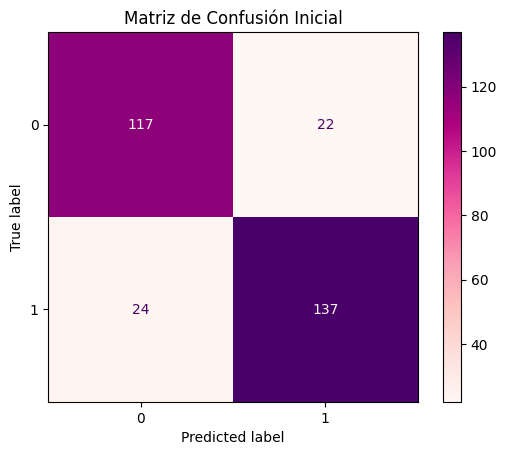

In [10]:
# Gráfica de matríz de confusión
cm_inicial, disp_inicial = crear_matriz_confusion(y_val, y_pred_inicial)
disp_inicial.plot(cmap='RdPu')
plt.title("Matriz de Confusión Inicial")
plt.show()

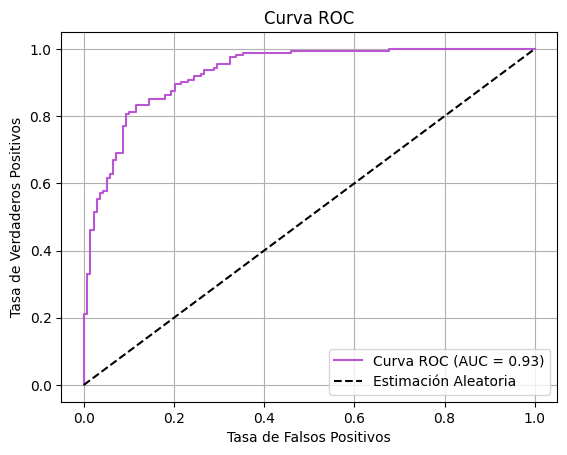

In [11]:
# Predicciones de probabilidad (para curva ROC)
fpr_inicial, tpr_inicial, thresholds_inicial, auc_score_inicial = calcular_roc_auc(y_val, y_scores_inicial)

# Gráfica de ROC
plt.figure()
plt.plot(fpr_inicial, tpr_inicial, color='mediumorchid', label=f"Curva ROC (AUC = {auc_score_inicial:.2f})")
plt.plot([0, 1], [0, 1], 'k--', label="Estimación Aleatoria")
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.grid()
plt.show()

In [12]:
# Cálculo de métricas de desempeño de la matriz de confusión
TPR_inicial, FPR_inicial = metricas_tpr_fpr(cm_inicial)

# Mostrar métricas
print(f"AUC: {(auc_score_inicial * 100):.4f}")
print(f"TPR (Tasa de Positivos Verdaderos): {(TPR_inicial * 100):.4f}")
print(f"FPR (Tasa de Falsos Positivos): {(FPR_inicial * 100):.4f}")

AUC: 92.9443
TPR (Tasa de Positivos Verdaderos): 85.0932
FPR (Tasa de Falsos Positivos): 15.8273


## Busqueda de mejores parámetros (Entrenamiento y Validación)

In [27]:
# Modelo base para encontrar mejores parámetros
lgbm = LGBMClassifier(random_state=22)

# Parámetros a buscar con GridSearchSV 
param_grid = {
    'num_leaves': [17,18, 19],
    'max_depth': [5, 6, 7],
    'min_data_in_leaf': [30, 40, 50],
    'learning_rate': [0.01, 0.05, 0.1],
    'lambda_l1': [0.0, 0.1],
    'lambda_l2': [0.0,0.1],
    'feature_fraction': [0.6, 0.7, 0.8],
    'n_estimators': [700, 800, 900]
}


# Cross-validation estratificada
cv = StratifiedKFold(
    n_splits=5, 
    shuffle=True, 
    random_state=22
)

grid = GridSearchCV(
    estimator=lgbm,
    param_grid=param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1,
    error_score='raise'
)

In [28]:
grid.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Info] Number of positiv

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=22, shuffle=True),
             error_score='raise', estimator=LGBMClassifier(random_state=22),
             n_jobs=-1,
             param_grid={'feature_fraction': [0.7], 'lambda_l1': [0.0],
                         'lambda_l2': [0.1], 'learning_rate': [0.05],
                         'max_depth': [6], 'min_data_in_leaf': [40],
                         'n_estimators': [800], 'num_leaves': [18]},
             scoring='roc_auc', verbose=1)

In [29]:
# Ver mejores hiperparámetros encontrados
grid.best_params_

{'feature_fraction': 0.7,
 'lambda_l1': 0.0,
 'lambda_l2': 0.1,
 'learning_rate': 0.05,
 'max_depth': 6,
 'min_data_in_leaf': 40,
 'n_estimators': 800,
 'num_leaves': 18}

In [30]:
# Entrenamiento del modelo con mejores hiperparámetros
best_lgbm = LGBMClassifier(
    num_leaves=18,
    max_depth=6,
    min_data_in_leaf=40,
    learning_rate=0.05,
    lambda_l1=0.0,
    lambda_l2=0.1,
    feature_fraction=0.7,
    n_estimators=800,
    random_state=22
)

best_lgbm.fit(X_train, y_train)

[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Info] Number of positive: 643, number of negative: 557
[LightGBM] [Info] Auto-choo

LGBMClassifier(feature_fraction=0.7, lambda_l1=0.0, lambda_l2=0.1,
               learning_rate=0.05, max_depth=6, min_data_in_leaf=40,
               n_estimators=800, num_leaves=18, random_state=22)

In [31]:
# Validación del modelo
y_pred, y_scores, reporte = reporte_clasificacion(X_val, y_val, best_lgbm)

print("Classification Report:")
print(reporte)

[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
Classification Report:
              precision    recall  f1-score   support

           0    

C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


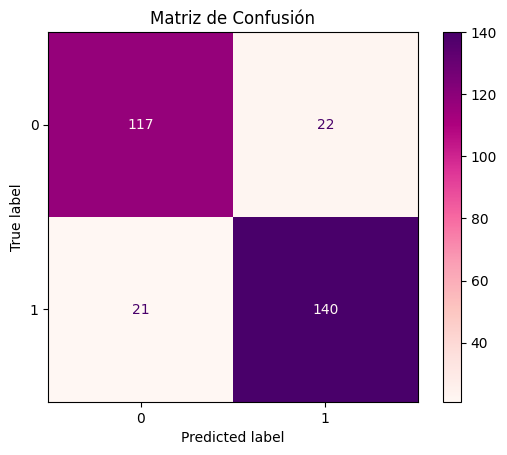

In [32]:
# Matriz de confusión
cm, disp = crear_matriz_confusion(y_val, y_pred)
disp.plot(cmap="RdPu")
plt.title("Matriz de Confusión")
plt.show()

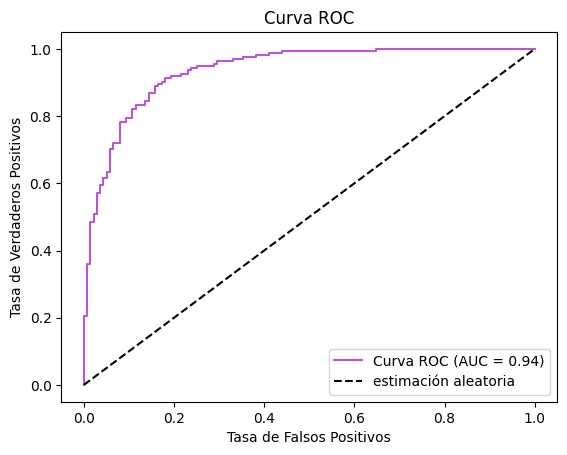

In [33]:
# Predicciones de scores (para curva ROC)
fpr, tpr, thresholds, auc_score = calcular_roc_auc(y_val, y_scores)

# Gráfica de ROC
plt.plot(fpr, tpr, color='mediumorchid', label=f"Curva ROC (AUC = {auc_score:.2f})")
plt.plot([0, 1], [0, 1], "k--", label='estimación aleatoria')
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

In [34]:
# Cálculo de métricas de desempeño de la matriz de confusión
TPR, FPR = metricas_tpr_fpr(cm)

# Mostrar métricas
print(f"AUC: {(auc_score * 100):.4f}")
print(f"TPR (Tasa de Verdaderos Positivos): {(TPR * 100):.4f}")
print(f"FPR (Tasa de Falsos Positivos): {(FPR * 100):.4f}")

AUC: 93.6280
TPR (Tasa de Verdaderos Positivos): 86.9565
FPR (Tasa de Falsos Positivos): 15.8273


## Modelo Final (Entrenamiento y Prueba)

In [35]:
# Entrenamiento del modelo con mejores hiperparámetros con todo el dataset de entrenamiento
modelLGBM = LGBMClassifier(
    num_leaves=18,
    max_depth=6,
    min_data_in_leaf=40,
    learning_rate=0.05,
    lambda_l1=0.0,
    lambda_l2=0.1,
    feature_fraction=0.7,
    n_estimators=800,
    random_state=22
)

modelLGBM.fit(X, y)

[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Info] Number of positive: 804, number of negative: 696
[LightGBM] [Info] Auto-choo

LGBMClassifier(feature_fraction=0.7, lambda_l1=0.0, lambda_l2=0.1,
               learning_rate=0.05, max_depth=6, min_data_in_leaf=40,
               n_estimators=800, num_leaves=18, random_state=22)

In [36]:
# Cargar datos para prueba
X_test_raw, y_test = data4embed(test=True)

print(X_raw[5:])
print(y_test[5:])

['ser gorda esta mal', 'si en un restaurante, la pretensión es el ingrediente principal del plato que pediste, mejor comete el pan.. Etiquetas: cocinardeverdadesotracosa', 'puaa increible, nose como permiten esas paginas de mierda que llenan la cabeza de bobadas. Etiquetas: diariode', 'perder una batalla, no significa que la guerra este perdida, cada día es una batalla, nuestras metas son la victoria.', 'cuando la ley no responde nuestras elecciones hacen el cambio. come local y sustentable, respetando la vida de los seres que serán tu comida.. Etiquetas: somosloquecomemos, somosloqueelegimos', 'quisiera pasar todas las vacaciones asi. Etiquetas: thin, thinspiration, thinsgap, thinspo, legs, perfect, outfit', 'hoy en el hemos robado a mel de estas fantásticas aloo parathas integrales. típicas de la cocina india las hemos convertido en el complemento perfecto de una cena sana, sabrosa y deliciosa. Etiquetas: asaltablog, recipes', 'estoy como para saltearme el almuerzo', 'estoy cansada d

In [37]:
# Obtener embeddings
X_test = get_embeddings(X_test_raw)

print(f"Longitud de conjunto de prueba:", len(X_test))


Longitud de conjunto de prueba: 250


In [38]:
# Prueba del modelo final
y_pred_test, y_scores_test, reporte_test = reporte_clasificacion(X_test, y_test, modelLGBM)

print("Classification Report:")
print(reporte_test)

[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
[LightGBM] [Warning] min_data_in_leaf is set=40, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=40
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=0.0, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0
[LightGBM] [Warning] lambda_l2 is set=0.1, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1
Classification Report:
              precision    recall  f1-score   support

           0    

C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\z47al\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


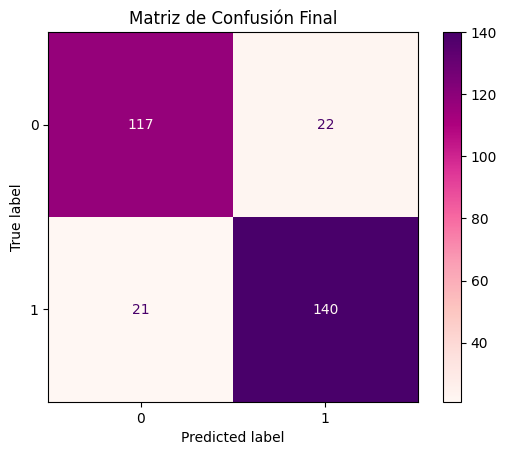

In [39]:
# Matriz de confusión
cm_test, disp_test = crear_matriz_confusion(y_test, y_pred_test)

disp_test.plot(cmap="RdPu")
plt.title("Matriz de Confusión Final")
plt.show()

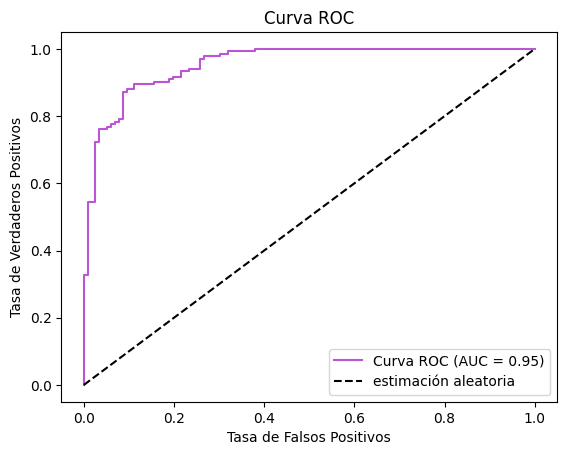

In [40]:
# Predicciones de probabilidad (para curva ROC)
fpr_test, tpr_test, thresholds_test, auc_score_test = calcular_roc_auc(y_test, y_scores_test)

# Gráfica ROC
plt.plot(fpr_test, tpr_test,color='mediumorchid', label=f"Curva ROC (AUC = {auc_score_test:.2f})")
plt.plot([0, 1], [0, 1], "k--", label='estimación aleatoria')
plt.xlabel("Tasa de Falsos Positivos")
plt.ylabel("Tasa de Verdaderos Positivos")
plt.title("Curva ROC")
plt.legend(loc="lower right")
plt.show()

In [41]:
# Cálculo de métricas de desempeño de la matriz de confusión
TPR_Test, FPR_Test = metricas_tpr_fpr(cm_test)

# Mostrar métricas
print(f"AUC: {(auc_score_test * 100):.4f}")
print(f"TPR (Tasa de Verdaderos Positivos): {(TPR_Test * 100):.4f}")
print(f"FPR (Tasa de Falsos Positivos): {(FPR_Test * 100):.4f}")

AUC: 95.4645
TPR (Tasa de Verdaderos Positivos): 89.5522
FPR (Tasa de Falsos Positivos): 14.6552


In [42]:
# Guardado del modelo final en un archivo pickle
hacer_pepinillo(modelLGBM, "modelLGBM.pkl")